# Aperture Photometry 1

In [71]:
!pip3 install sklearn

    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\grado\anaconda3\python.exe' -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\grado\\AppData\\Local\\Temp\\pip-install-0dwg0mhr\\sklearn\\setup.py'"'"'; __file__='"'"'C:\\Users\\grado\\AppData\\Local\\Temp\\pip-install-0dwg0mhr\\sklearn\\setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base 'C:\Users\grado\AppData\Local\Temp\pip-pip-egg-info-_kbzvhor'
         cwd: C:\Users\grado\AppData\Local\Temp\pip-install-0dwg0mhr\sklearn\
    Complete output (15 lines):
    The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
    rather than 'sklearn' for pip commands.
    
    Here is how to fix this error in the main use cases:
    - use 'pip install scikit-learn' rather than 'pip install sklearn'
    - replace 'sklearn' by 'scikit-learn' in your pip requir

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)


In [72]:
from glob import glob
from astropy.io import fits
from astropy.visualization import hist
from astropy.modeling import fitting
from astropy.modeling.models import custom_model
fitter = fitting.LevMarLSQFitter()

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colormaps
import scipy.ndimage as ndi
import astropy.stats as astrostats

# configuration
np.set_printoptions(linewidth=120) # para que se vea

cmap = plt.get_cmap("inferno")
cmap.set_bad(color="r")
cmap.set_over(color="w")
if "astro" in plt.colormaps():
    colormaps.unregister("astro")
colormaps.register(cmap,name="astro")
plt.rcParams["image.origin"] = "lower"
plt.rcParams["image.cmap"] = "astro"
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams["axes.labelsize"] = 15



def quantile_linspace(arr,num=100,lower=0.01,upper=0.99):
    return np.linspace(*np.quantile(np.ravel(arr),[lower,upper]),num=num)

def quantile_imshow(img,lower=0.01,upper=0.99,**kwargs):
    img_vmin = np.quantile(img,lower)
    img_vmax = np.quantile(img,upper)
    return plt.imshow(img,vmin=img_vmin,vmax=img_vmax,**kwargs)

def quantile_hist(data,num=100,lower=0.01,upper=0.99):
    return plt.hist(np.ravel(data),bins=quantile_linspace(np.ravel(data),num,lower,upper))

def pseudomode(arr,sigma=1.6,maxiters=20):
    masked = astrostats.sigma_clip(arr,sigma=sigma,maxiters=maxiters)
    return arr[~masked.mask].mean()

# M 92

In [73]:
hdul = fits.open("M92.fits");
headers ={hdu.name:hdu.header for hdu in hdul}
images = {hdu.name:hdu.data.astype(float) for hdu in hdul}
hdul.close()

In [74]:
headers

{'BIAS 25': SIMPLE  =                    T  /  FITS STANDARD                                
 BITPIX  =                   16  /  FITS BITS/PIXEL                              
 NAXIS   =                    2  /  NUMBER OF AXES                               
 NAXIS1  =                  318                                                  
 NAXIS2  =                  507                                                  
 EXTEND  =                    T                                                  
 BSCALE  =       1.0000000000E0  /  REAL = TAPE*BSCALE + BZERO                   
 BZERO   =       0.0000000000E0  /                                               
 OBJECT  = 'ave of 25 bias'      /                                               
 ORIGIN  = 'KPNO-IRAF'           /                                               
 DATE    = '17-09-93'            /                                               
 IRAFNAME= 'm92001.imh'          /  NAME OF IRAF IMAGE FILE                      
 IRAF

## Bias model

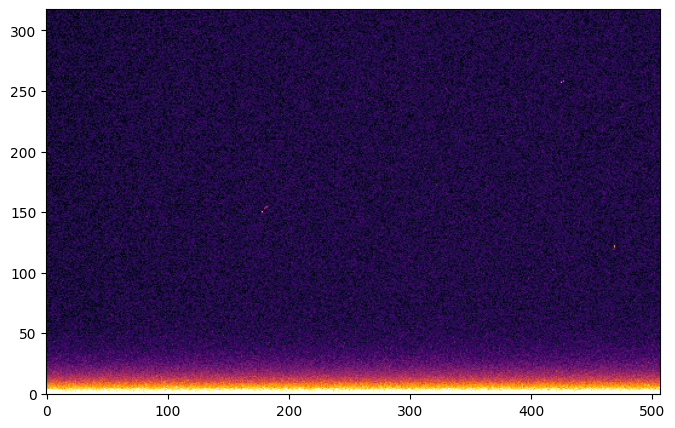

In [75]:
quantile_imshow(images["BIAS 25"].T)

In [76]:
def bias_model(x,y,/,m=0,b=1000,A=300,c=100,n=1):
    return m*x + b + n*x**2 + A*np.exp(-y/c)
BiasModel = custom_model(bias_model)
bias_model = BiasModel()

bias = images["BIAS 25"]
X,Y = np.mgrid[:bias.shape[0],:bias.shape[1]]
bias_model = fitter(bias_model,X,Y,bias)(X,Y)

In [77]:
images

{'BIAS 25': array([[528., 525., 524., ..., 502., 498., 501.],
        [533., 524., 524., ..., 497., 500., 499.],
        [530., 527., 524., ..., 504., 500., 498.],
        ...,
        [528., 527., 524., ..., 501., 500., 498.],
        [530., 525., 527., ..., 503., 501., 501.],
        [530., 527., 525., ..., 500., 499., 498.]]),
 'FLAT B 5': array([[1840., 1838., 1836., ..., 1833., 1856., 1838.],
        [1853., 1872., 1823., ..., 1838., 1830., 1841.],
        [1847., 1843., 1849., ..., 1851., 1845., 1838.],
        ...,
        [1895., 1863., 1888., ..., 1835., 1861., 1853.],
        [1872., 1889., 1877., ..., 1853., 1831., 1838.],
        [1891., 1868., 1861., ..., 1837., 1860., 1864.]]),
 'FLAT V 5': array([[1994., 1981., 1976., ..., 1973., 2011., 1988.],
        [2000., 2012., 1981., ..., 1978., 1982., 2006.],
        [1995., 1990., 1993., ..., 1996., 1990., 1979.],
        ...,
        [2058., 2017., 2035., ..., 2007., 2032., 2028.],
        [2030., 2061., 2043., ..., 2025., 1992

In [78]:
flatV = images["FLAT V 5"]
flatV -= bias_model
flatV /= flatV.mean()

flatB = images["FLAT B 5"]
flatB -= bias_model
flatB /= flatB.mean()

In [79]:
imgV1 = images["V 1"] - bias_model
imgV1 /= flatV

imgV2 = images["V 2"] - bias_model
imgV2 /= flatV

imgB1 = images["B 1"] - bias_model
imgB1 /= flatB

imgB2 = images["B 2"] - bias_model
imgB2 /= flatB

In [80]:
imgV1.shape

(507, 318)

## Source finding

### Masking

In [81]:
X_v1,Y_v1 = np.mgrid[:imgV1.shape[0],:imgV1.shape[1]]
X_v2,Y_v2 = np.mgrid[:imgV2.shape[0],:imgV2.shape[1]]
X_b1,Y_b1 = np.mgrid[:imgB1.shape[0],:imgB1.shape[1]]
X_b2,Y_b2 = np.mgrid[:imgB2.shape[0],:imgB2.shape[1]]

In [82]:
mask_v1 = (X_v1>15) & (X_v1<470) & (Y_v1>10) & (Y_v1<295)
mask_v2 = (X_v2>15) & (X_v2<470) & (Y_v2>10) & (Y_v2<295)
mask_b1 = (X_b1>15) & (X_b1<470) & (Y_b1>10) & (Y_b1<295)
mask_b2 = (X_b2>15) & (X_b2<470) & (Y_b2>10) & (Y_b2<295)

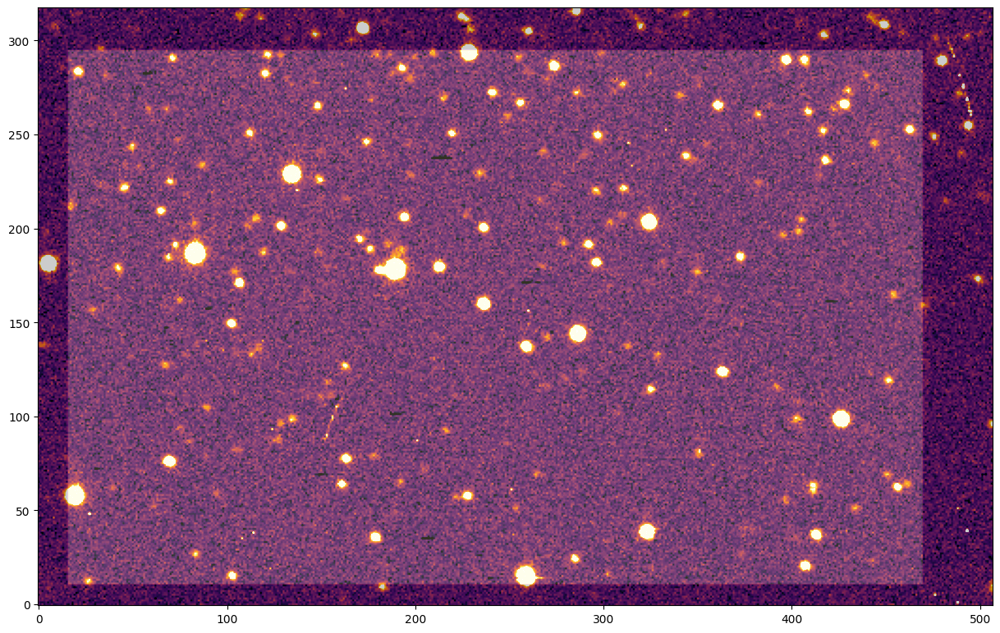

In [83]:
plt.figure(figsize=(15,15))
quantile_imshow(imgB1.T)#,vmin=300,vmax=600)
plt.imshow(mask_v1.T,alpha=0.2)

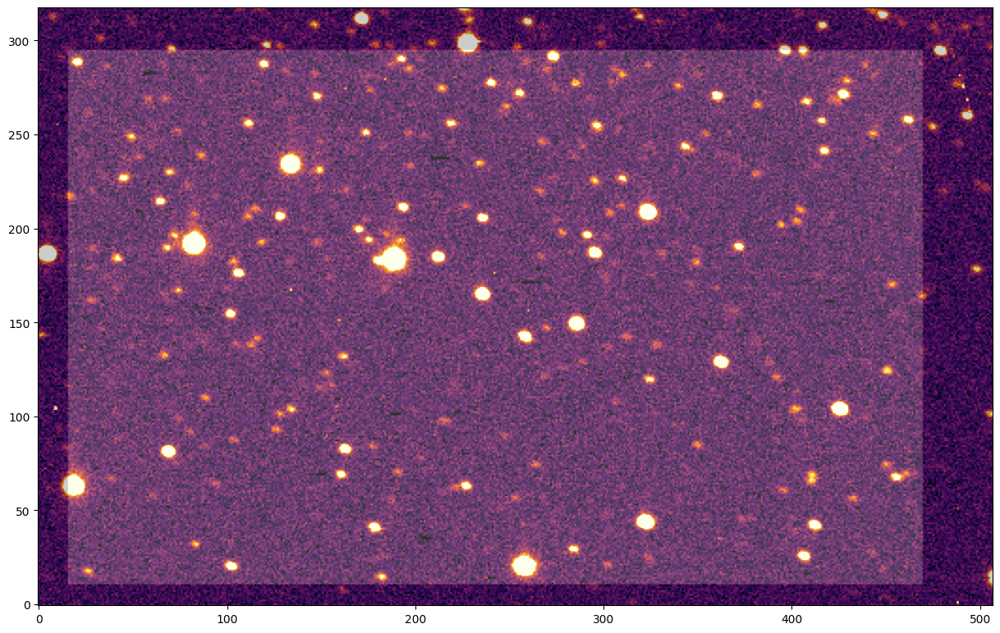

In [84]:
plt.figure(figsize=(15,15))
quantile_imshow(imgV2.T)#,vmin=300,vmax=600)
plt.imshow(mask_v2.T,alpha=0.2)

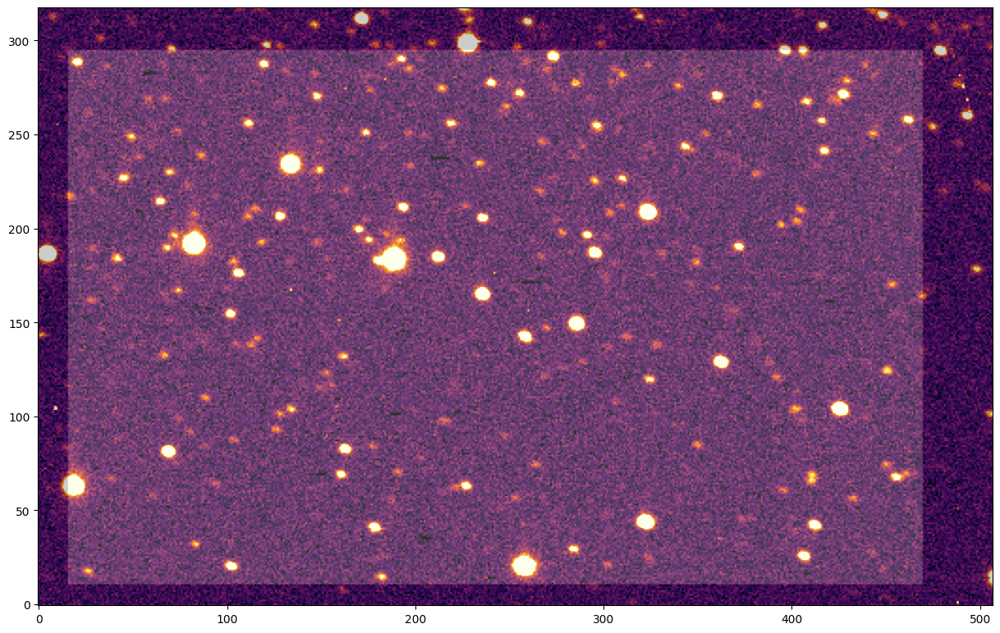

In [85]:
plt.figure(figsize=(15,15))
quantile_imshow(imgV2.T)#,vmin=300,vmax=600)
plt.imshow(mask_b2.T,alpha=0.2)

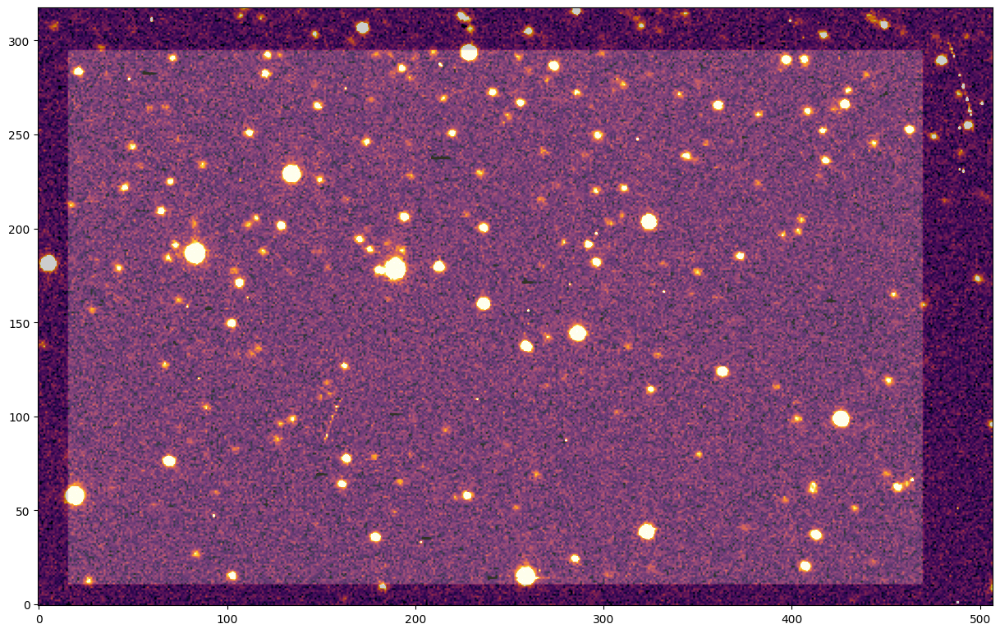

In [86]:
plt.figure(figsize=(15,15))
quantile_imshow(imgB2.T)#,vmin=300,vmax=600)
plt.imshow(mask_b2.T,alpha=0.2)

### Centroids

In [88]:
from skimage.feature import peak_local_max
from photutils.centroids import centroid_sources, centroid_quadratic # can be any of centroid_1dg, centroid_2dg, centroid_com, centroid_quadratic

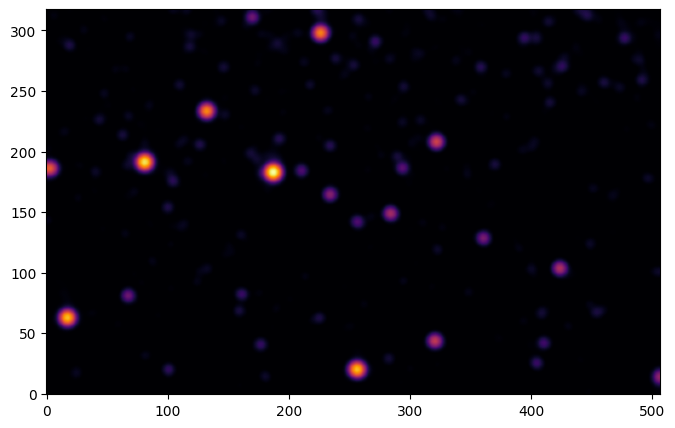

In [89]:
plt.imshow(ndi.gaussian_filter(imgV1,3).T,vmin=50,norm="log")

In [90]:
peaksV1 = peak_local_max(
    ndi.gaussian_filter(imgV1,3),
    threshold_abs=60,
    labels=mask_v1*1,
    min_distance=7,
    exclude_border=15
)

peaksV2 = peak_local_max(
    ndi.gaussian_filter(imgV2,3),
    threshold_abs=60,
    labels=mask_v2*1,
    min_distance=7,
    exclude_border=15
)

peaksB1 = peak_local_max(
    ndi.gaussian_filter(imgB1,3),
    threshold_abs=60,
    labels=mask_b1*1,
    min_distance=7,
    exclude_border=15
)

peaksB2 = peak_local_max(
    ndi.gaussian_filter(imgB2,3),
    threshold_abs=60,
    labels=mask_b2*1,
    min_distance=7,
    exclude_border=15
)

Text(0.5, 1.0, 'Coordenadas V1')

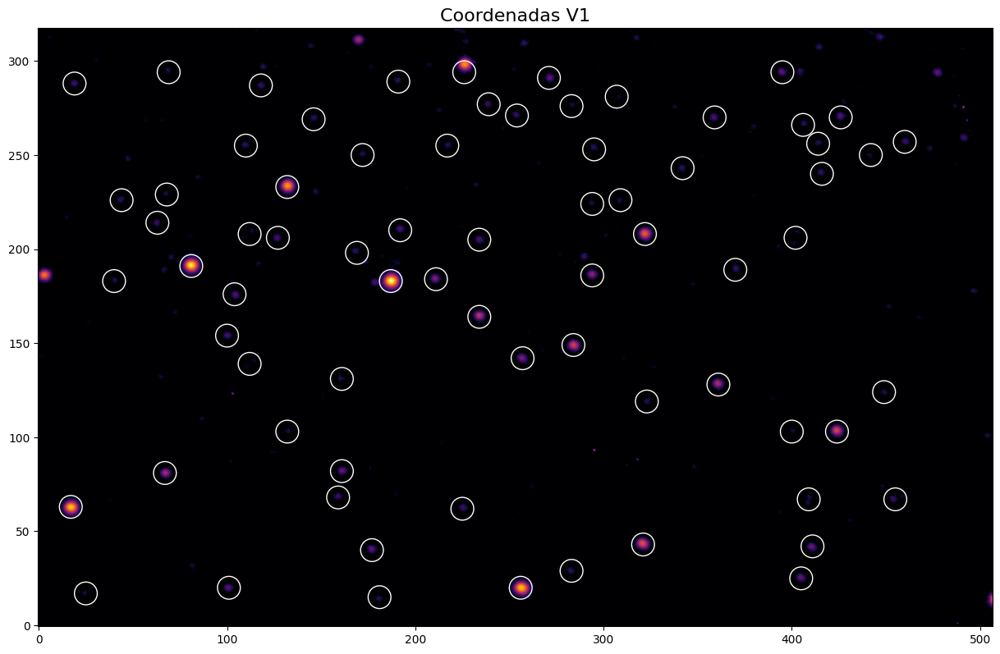

In [113]:
plt.figure(figsize=(15,15))
plt.imshow(imgV1.T,vmin=70,norm="log")
plt.scatter(*peaksV1.T,fc="none",ec="w",s=400)
plt.title("Coordenadas V1",fontsize=16)

Text(0.5, 1.0, 'Coordenadas V2')

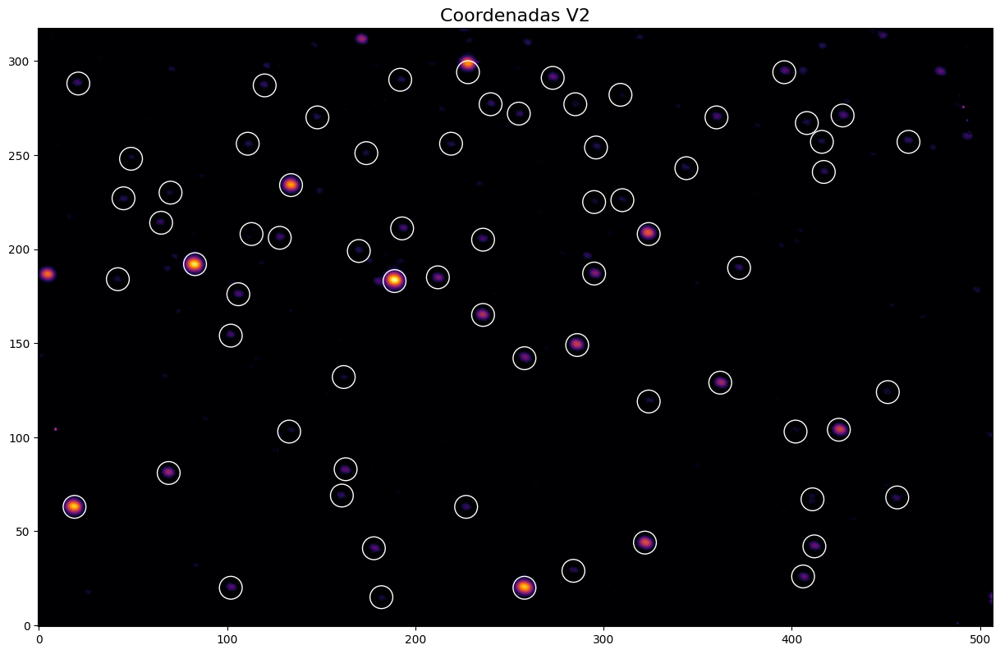

In [112]:
plt.figure(figsize=(15,15))
plt.imshow(imgV2.T,vmin=70,norm="log")
plt.scatter(*peaksV2.T,fc="none",ec="w",s=400)
plt.title("Coordenadas V2",fontsize=16)

(array([1.61082e+05, 7.70000e+01, 3.00000e+01, 1.50000e+01, 9.00000e+00, 6.00000e+00, 3.00000e+00, 3.00000e+00,
        0.00000e+00, 1.00000e+00]),
 array([-2.13536599e-02,  1.01483948e+03,  2.02970031e+03,  3.04456114e+03,  4.05942198e+03,  5.07428281e+03,
         6.08914364e+03,  7.10400447e+03,  8.11886531e+03,  9.13372614e+03,  1.01485870e+04]),
 <BarContainer object of 10 artists>)

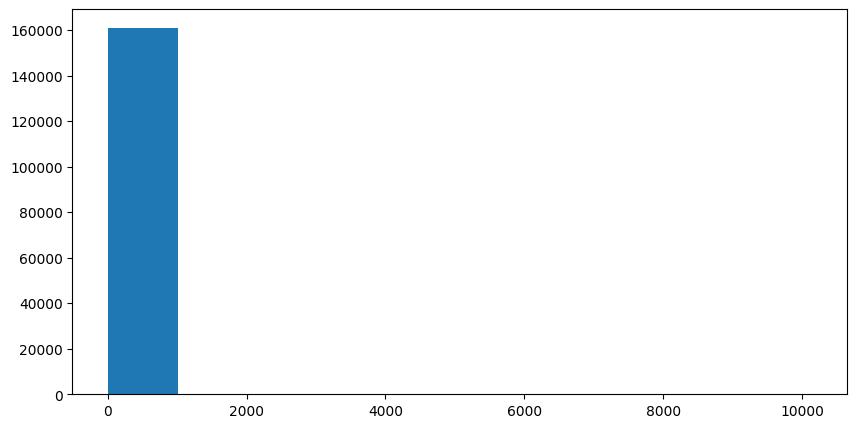

In [96]:
plt.hist(imgV1.ravel())

Text(0.5, 1.0, 'Coordenadas B1')

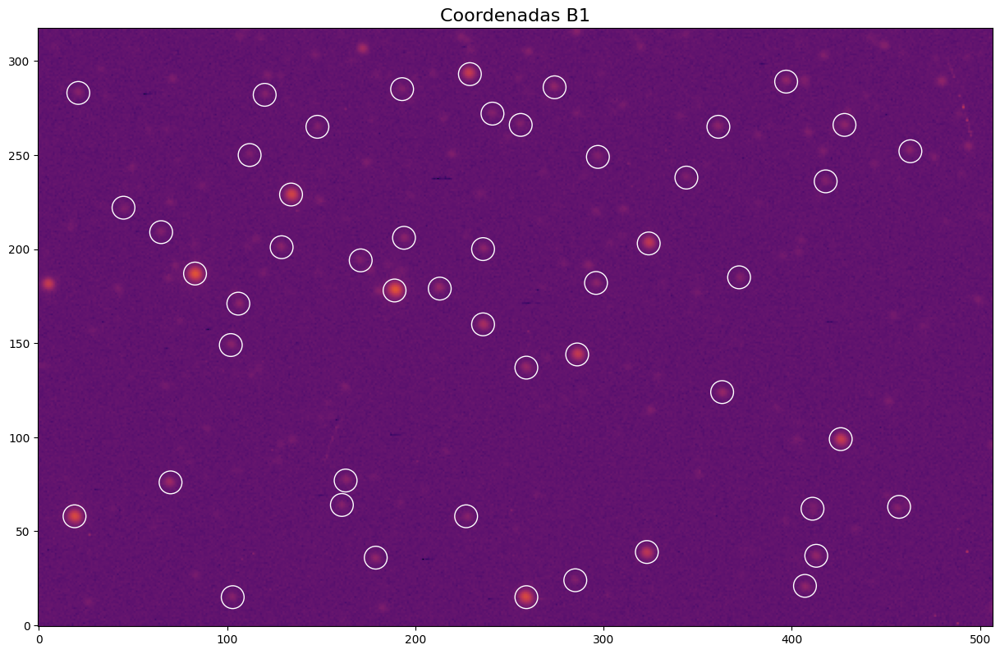

In [111]:
plt.figure(figsize=(15,15))
plt.imshow(imgB1.T,norm="log",vmax=1000000)
plt.scatter(*peaksB1.T,fc="none",ec="w",s=400)
plt.title("Coordenadas B1",fontsize=16)

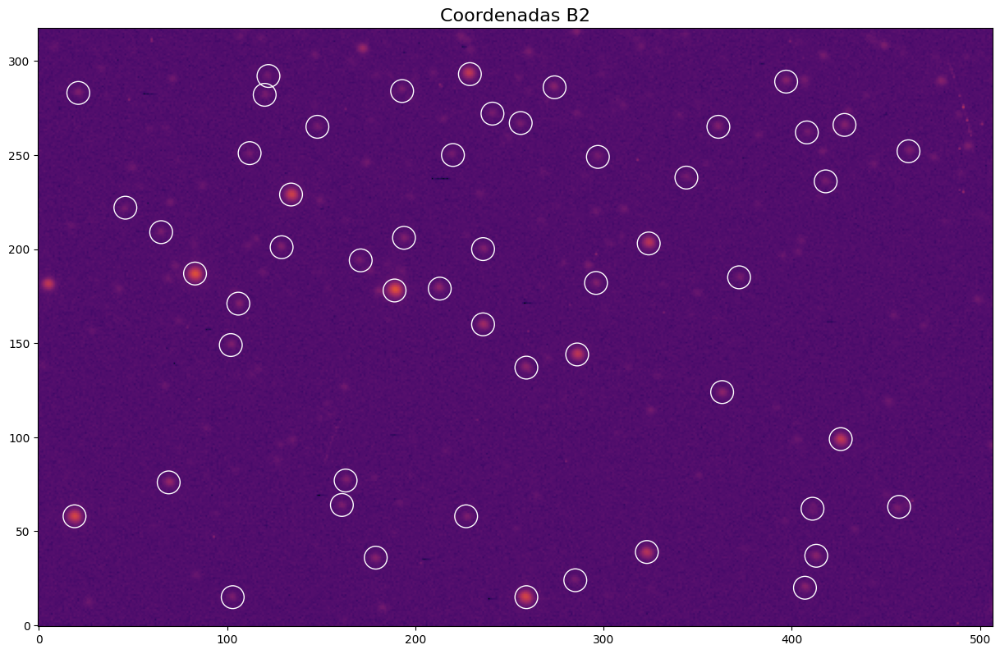

In [110]:
plt.figure(figsize=(15,15))
plt.imshow(imgB2.T,norm="log",vmax=1000000)
plt.title("Coordenadas B2",fontsize=16)
plt.scatter(*peaksB2.T,fc="none",ec="w",s=400)

In [114]:
centroidsV1 = np.array(
    centroid_sources((imgV1-imgV1.mean()).T,*peaksV1.T,centroid_func=centroid_quadratic,box_size=9)
).T

centroidsV2 = np.array(
    centroid_sources((imgV2-imgV2.mean()).T,*peaksV2.T,centroid_func=centroid_quadratic,box_size=9)
).T

centroidsB1 = np.array(
    centroid_sources((imgB1-imgB1.mean()).T,*peaksB1.T,centroid_func=centroid_quadratic,box_size=9)
).T

centroidsB2 = np.array(
    centroid_sources((imgB2-imgB2.mean()).T,*peaksB2.T,centroid_func=centroid_quadratic,box_size=9)
).T



In [115]:
distancesV1 = np.hypot(*(peaksV1-centroidsV1).T)
distancesV2 = np.hypot(*(peaksV2-centroidsV2).T)
distancesB1 = np.hypot(*(peaksB1-centroidsB1).T)
distancesB2 = np.hypot(*(peaksB2-centroidsB2).T)

In [116]:
distancesV1

array([0.21098386, 0.06704233, 0.28078886, 0.26764417, 0.27512109, 4.        , 0.10259808, 0.48805726, 0.54561566,
       0.25972405, 0.27383499, 0.38073527, 0.30503269, 0.27049165, 0.42023381, 0.4339905 , 0.64957925, 0.17048924,
       0.30396154, 0.61144169, 0.63082429, 0.53492013, 0.34249294, 0.20689918, 0.87180766, 0.24338308, 0.64479643,
       0.3577951 , 0.37900749, 0.22424106, 0.1892669 , 0.48080307, 1.15740354, 0.251655  , 0.57745182, 0.40088287,
       0.34287913, 0.28901793, 0.35130207, 1.1892972 , 0.63242977, 0.89451204, 0.37105172, 0.31396577, 0.40769139,
       0.31971865, 0.82180063, 0.59968995, 0.56364397, 0.22730837, 0.38088045, 0.26163774, 0.17008162, 0.13276972,
       0.98937821, 0.1650973 , 0.18199271, 0.35102791, 0.58808714, 0.37901703, 0.73096139, 0.72790834, 0.57216014,
       1.98974887, 0.31906223, 0.30512402, 3.04432467, 0.75836199, 1.3029864 , 0.57651898, 0.8623021 , 2.99616617])

Text(0.5, 0, 'Distance correction [pix]')

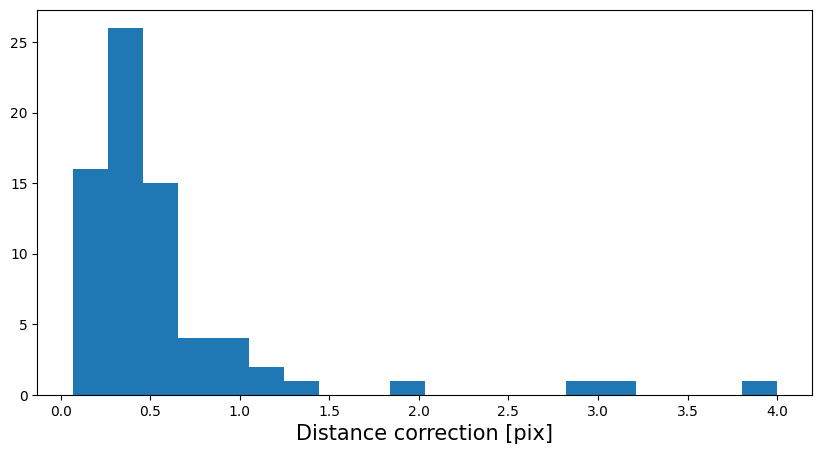

In [117]:
plt.hist(distancesV1,bins=20);
plt.xlabel("Distance correction [pix]")

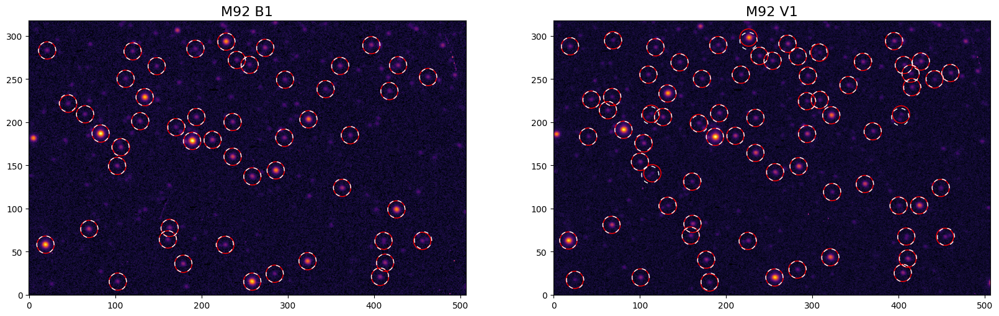

In [122]:
# Crear figura y ejes para los subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Primera imagen con imgB1
axes[0].imshow(imgB1.T, vmin=30, norm="log")
axes[0].scatter(*centroidsB1.T, fc="none", ec="r", s=400)
axes[0].scatter(*peaksB1.T, fc="none", ec="w", s=400, linestyle=(5, (5, 5)))
axes[0].set_title("M92 B1",fontsize=16)

# Segunda imagen con imgV1
axes[1].imshow(imgV1.T, vmin=30, norm="log")
axes[1].scatter(*centroidsV1.T, fc="none", ec="r", s=400)  # Cambio a centroidsV1
axes[1].scatter(*peaksV1.T, fc="none", ec="w", s=400, linestyle=(5, (5, 5)))  # Cambio a peaksV1
axes[1].set_title("M92 V1",fontsize=16)  # Cambio el título

plt.show()

## Radial profile and FWHM

In [123]:
from photutils.aperture import CircularAperture, ApertureStats
from photutils.profiles import RadialProfile
from astropy.modeling.models import Gaussian1D,Voigt1D,Const1D
from astropy.modeling.fitting import LevMarLSQFitter
fitter = LevMarLSQFitter(calc_uncertainties=True)

In [124]:
model = Const1D(100) + Gaussian1D(5e3,0,1.5)
model.mean_1.fixed = True

In [125]:
radii = np.arange(0,10,1)
profileV1 = RadialProfile(imgV1.T,centroidsV1[0],radii)
fitted_modelV1 = fitter(model,profileV1.radius,profileV1.profile)
profileV2 = RadialProfile(imgV2.T,centroidsV2[0],radii)
fitted_modelV2 = fitter(model,profileV2.radius,profileV2.profile)

profileB1 = RadialProfile(imgB1.T,centroidsB1[0],radii)
fitted_modelB1 = fitter(model,profileB1.radius,profileB1.profile)

profileB2 = RadialProfile(imgB2.T,centroidsB2[0],radii)
fitted_modelB2 = fitter(model,profileB2.radius,profileB2.profile)


In [129]:
paramsV1 = []
params_stdV1 = []
for c in centroidsV1:
    try:
        profile = RadialProfile(imgV1.T,c,radii)
        fitted_model = fitter(model,profile.radius,profile.profile)
        params_stdV1.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        paramsV1.append(fitted_model.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

paramsV1 = np.asarray(paramsV1)
params_stdV1 = np.asarray(params_stdV1)

x = np.log10(paramsV1.T[1])
y = 2*np.sqrt(2*np.log(2))*paramsV1.T[3]
dx = params_stdV1.T[1]/paramsV1.T[1] / np.log(10)
dy = 2*np.sqrt(2*np.log(2))*params_stdV1.T[2]


samples = np.random.normal(loc=y,scale=dy,size=(10_000,len(y)))
means = samples.mean(axis=1)

FWHMV1 = means.mean()
FWHM_errV1 = means.std()
FWHMV1

3.2923164697726306

In [130]:
paramsV2 = []
params_stdV2 = []
for c in centroidsV2:
    try:
        profile = RadialProfile(imgV2.T,c,radii)
        fitted_model = fitter(model,profile.radius,profile.profile)
        params_stdV2.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        paramsV2.append(fitted_model.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

paramsV2 = np.asarray(paramsV2)
params_stdV2 = np.asarray(params_stdV2)

x = np.log10(paramsV2.T[1])
y = 2*np.sqrt(2*np.log(2))*paramsV2.T[3]
dx = params_stdV2.T[1]/paramsV2.T[1] / np.log(10)
dy = 2*np.sqrt(2*np.log(2))*params_stdV2.T[2]


samples = np.random.normal(loc=y,scale=dy,size=(10_000,len(y)))
means = samples.mean(axis=1)

FWHMV2 = means.mean()
FWHM_errV2 = means.std()
FWHMV2

3.7487738605659024

In [132]:
paramsB1 = []
params_stdB1 = []
for c in centroidsB1:
    try:
        profile = RadialProfile(imgB1.T,c,radii)
        fitted_model = fitter(model,profile.radius,profile.profile)
        params_stdB1.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        paramsB1.append(fitted_model.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

paramsB1 = np.asarray(paramsB1)
params_stdB1 = np.asarray(params_stdB1)

x = np.log10(paramsB1.T[1])
y = 2*np.sqrt(2*np.log(2))*paramsB1.T[3]
dx = params_stdB1.T[1]/paramsB1.T[1] / np.log(10)
dy = 2*np.sqrt(2*np.log(2))*params_stdB1.T[2]


samples = np.random.normal(loc=y,scale=dy,size=(10_000,len(y)))
means = samples.mean(axis=1)

FWHMB1 = means.mean()
FWHM_errB1 = means.std()
FWHMB1

3.651073339350174

In [133]:
paramsB2 = []
params_stdB2 = []
for c in centroidsB2:
    try:
        profile = RadialProfile(imgB2.T,c,radii)
        fitted_model = fitter(model,profile.radius,profile.profile)
        params_stdB2.append(np.sqrt(np.diag(fitter.fit_info["param_cov"])))
        paramsB2.append(fitted_model.parameters)
    except ValueError:
        pass
    #plt.plot(profile.radius,profile.gaussian_profile)
    #plt.plot(profile.radius,profile.profile,". k")
    #plt.show()
    #plt.close()

paramsB2 = np.asarray(paramsB2)
params_stdB2 = np.asarray(params_stdB2)

x = np.log10(paramsB2.T[1])
y = 2*np.sqrt(2*np.log(2))*paramsB2.T[3]
dx = params_stdB2.T[1]/paramsB2.T[1] / np.log(10)
dy = 2*np.sqrt(2*np.log(2))*params_stdB2.T[2]


samples = np.random.normal(loc=y,scale=dy,size=(10_000,len(y)))
means = samples.mean(axis=1)

FWHMB2 = means.mean()
FWHM_errB2 = means.std()
FWHMB2

3.422560247633038

Text(0.5, 1.0, 'FWHM mean = $3.292\\pm0.009$')

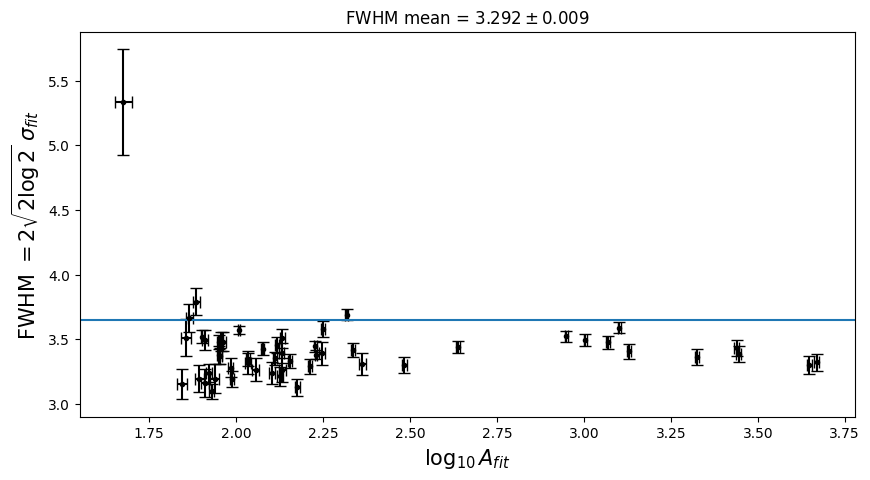

In [134]:
plt.errorbar(x,y,dy,dx,fmt=". k",capsize=4)

plt.xlabel("$\\log_{10} A_{fit}$")
plt.ylabel("FWHM $= 2\\sqrt{2\\log 2}\\;\\sigma_{fit}$")

plt.axhline(FWHMB1)
plt.title(f"FWHM mean = ${FWHMV1:.3f}\\pm{FWHM_errV1:.3f}$")

In [45]:
centroidsV2=centroidsV2[~np.isnan(centroidsV2.sum(axis=1))]

In [46]:
centroidsV2

array([[188.88524457, 183.25739853],
       [ 82.72185492, 191.75894946],
       [ 18.80195522,  63.09824915],
       [257.90967694,  20.27553249],
       [133.93559069, 233.91754654],
       [323.57238477, 208.40735188],
       [228.        , 298.        ],
       [322.21594153,  43.98417105],
       [425.48463325, 104.02123158],
       [285.74007632, 149.20850294],
       [235.66315764, 164.9744434 ],
       [362.32706482, 128.94745329],
       [ 68.94734178,  81.24750052],
       [295.40227597, 186.93459365],
       [212.21214668, 184.72770041],
       [258.36723758, 142.44906231],
       [412.0734725 ,  42.22691058],
       [162.73637165,  82.65259766],
       [406.54189681,  25.85990607],
       [273.18055239, 291.15754605],
       [427.23132313, 270.97428404],
       [178.55740156,  41.01543894],
       [396.30015352, 294.3948926 ],
       [102.30383347,  20.28577975],
       [106.15615906, 176.00242282],
       [360.15952506, 270.17403848],
       [193.74059282, 211.05156451],
 

In [151]:
from sklearn.neighbors import NearestNeighbors
distanciamin,indx=NearestNeighbors(n_neighbors=2).fit(centroidsV1).kneighbors(centroidsV1)
mindistanciaV1=min(distanciamin[:,1])
distanciamin,indx=NearestNeighbors(n_neighbors=2).fit(centroidsV2).kneighbors(centroidsV2)
mindistanciaV2=min(distanciamin[:,1])
distanciamin,indx=NearestNeighbors(n_neighbors=2).fit(centroidsB1).kneighbors(centroidsB1)
mindistanciaB1=min(distanciamin[:,1])
distanciamin,indx=NearestNeighbors(n_neighbors=2).fit(centroidsB2).kneighbors(centroidsB2)
mindistanciaB2=min(distanciamin[:,1])
mindistanciaB1

13.579279417207587

In [48]:
from photutils.aperture import CircularAnnulus

In [49]:
centroidsV2

array([[188.88524457, 183.25739853],
       [ 82.72185492, 191.75894946],
       [ 18.80195522,  63.09824915],
       [257.90967694,  20.27553249],
       [133.93559069, 233.91754654],
       [323.57238477, 208.40735188],
       [228.        , 298.        ],
       [322.21594153,  43.98417105],
       [425.48463325, 104.02123158],
       [285.74007632, 149.20850294],
       [235.66315764, 164.9744434 ],
       [362.32706482, 128.94745329],
       [ 68.94734178,  81.24750052],
       [295.40227597, 186.93459365],
       [212.21214668, 184.72770041],
       [258.36723758, 142.44906231],
       [412.0734725 ,  42.22691058],
       [162.73637165,  82.65259766],
       [406.54189681,  25.85990607],
       [273.18055239, 291.15754605],
       [427.23132313, 270.97428404],
       [178.55740156,  41.01543894],
       [396.30015352, 294.3948926 ],
       [102.30383347,  20.28577975],
       [106.15615906, 176.00242282],
       [360.15952506, 270.17403848],
       [193.74059282, 211.05156451],
 

In [165]:
1.75*FWHMB2,(mindistanciaB2-FWHMB2)*0.95

(6.160608445739468, 6.263357040034668)

In [182]:
sky_aperturesV1= CircularAnnulus(centroidsV1,1.9*FWHMV1,(mindistanciaV1-FWHMV1)*0.85)
star_aperturesV1= CircularAperture(centroidsV1,FWHMV1)

sky_aperturesV2= CircularAnnulus(centroidsV2,1.9*FWHMV2,(mindistanciaV2-FWHMV2)*0.85)
star_aperturesV2= CircularAperture(centroidsV2,FWHMV2)

sky_aperturesB1= CircularAnnulus(centroidsB1,1.9*FWHMB1,(mindistanciaB1-FWHMB1)*0.85)
star_aperturesB1= CircularAperture(centroidsB1,FWHMB1)

sky_aperturesB2= CircularAnnulus(centroidsB2,1.75*FWHMB2,(mindistanciaB2-FWHMB2)*0.95)
star_aperturesB2= CircularAperture(centroidsB2,FWHMB2)

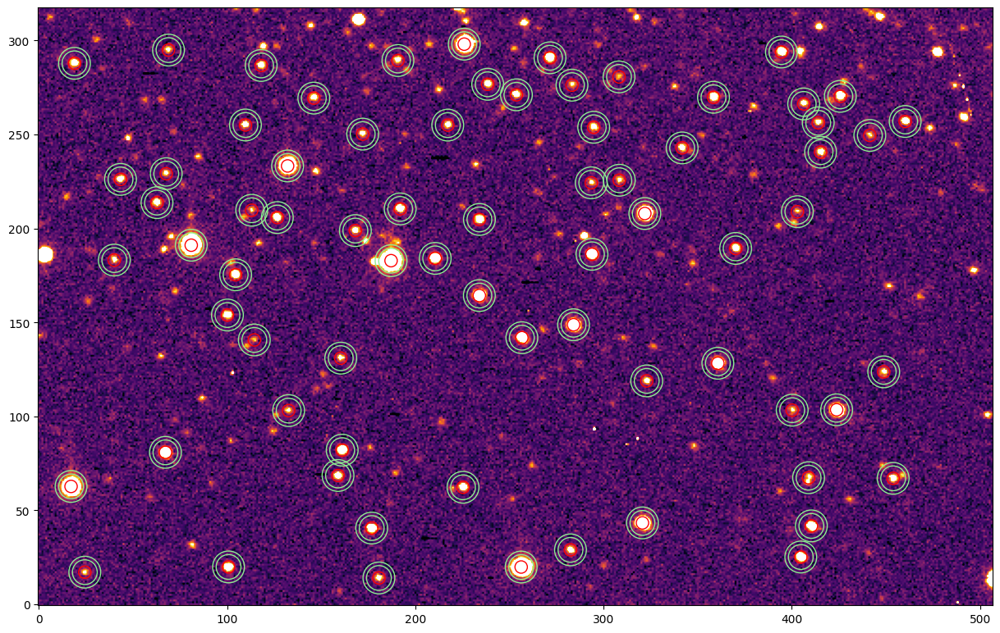

In [176]:
plt.figure(figsize=(15,15))
quantile_imshow(imgV1.T);
sky_aperturesV1.plot(color="lightgreen");
star_aperturesV1.plot(color="red");

In [177]:
sky_aperturesV1.area_overlap

<bound method PixelAperture.area_overlap of <CircularAnnulus([[187.13814438, 182.84053113],
                [ 80.98357611, 191.06499946],
                [ 17.14102858,  62.75719694],
                [256.24328594,  19.88844126],
                [132.16765521, 233.21813607],
                [226.        , 298.        ],
                [321.93479944, 207.92078351],
                [320.67040964,  43.35995845],
                [423.82603325, 103.51713829],
                [284.08018925, 148.75296504],
                [234.02068457, 164.27305265],
                [360.73514857, 128.27351978],
                [ 67.28490983,  80.89104435],
                [293.8479083 , 186.22368247],
                [256.60328741, 141.86137975],
                [210.56952239, 184.05510695],
                [410.39553175,  41.76215271],
                [161.16130813,  82.05519301],
                [404.78364575,  25.21350282],
                [271.55665436, 290.74702398],
                [176.84436031,  40

In [178]:
star_aperturesB2.area,sky_aperturesB2.area

(36.80036077143504, 10.542448397088428)

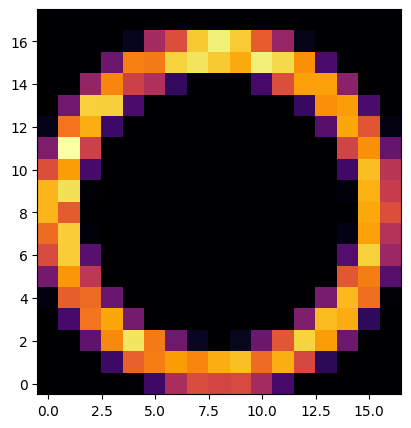

In [181]:
plt.imshow(sky_aperturesV1[1].to_mask().multiply(imgV1.T))

In [60]:
sky_aperturesV1[0].to_mask().multiply(imgV1.T)

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 3.97555311e+00, 1.40468104e+01, 1.71761267e+01, 1.30438598e+01,
        8.25737564e+00, 1.32357390e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 2.70550188e+00,
        2.36330507e+01, 4.80030937e+01, 6.38933902e+01, 6.63307705e+01, 6.06126680e+01, 6.06117519e+01,
        4.98345088e+01, 5.73223380e+01, 3.86164628e+01, 6.58811196e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.70325741e+01, 5.13528191e+01,
        6.09838830e+01, 4.89816995e+01, 6.45911854e+01, 8.09806370e+01, 6.04884347e+01, 5.27711654e+01,
        5.37106429e+01

In [62]:
for i in sky_aperturesV1:
    v=i.to_mask().get_values(imgV1.T)
    print(np.median(v))

53.93356982324205
51.901798815419056
49.93371893634846
48.438171774651025
47.01491741136842
43.72653239159587
42.68785825607217
42.28076689930849
41.17215886663579
41.79404008704432
41.95524502722499
40.98915332075966
41.84137810707355
44.72181658569649
41.54777559636761
40.94399644982839
41.004542057367146
40.2521190841659
40.80940994121773
41.46306880780353
41.09735826310548
42.936240286559816
43.6895059453684
41.19692223020953
42.43073051385267
39.86497679460508
41.29071125060785
41.306143772461866
40.37050989453501
41.79032930593181
42.22461935078428
41.2274178926305
40.21322749674887
40.43542790103732
40.68463881327623
39.37752639137347
40.56487066023189
42.48847386382931
42.62702530154159
42.56920837200702
42.281115243661475
41.49481665757534
40.89954502859034
41.02045898098586
40.918717135750825
41.70727680945859
43.280721986474475
40.05902458752136
41.36616671213851
41.33400755130235
41.431741128096654
42.95468326089948
40.11554300472122
39.57477098918305
39.524749986971074
40.

In [63]:
sky_aperturesV2

<CircularAnnulus([[188.88524457, 183.25739853],
                [ 82.72185492, 191.75894946],
                [ 18.80195522,  63.09824915],
                [257.90967694,  20.27553249],
                [133.93559069, 233.91754654],
                [323.57238477, 208.40735188],
                [228.        , 298.        ],
                [322.21594153,  43.98417105],
                [425.48463325, 104.02123158],
                [285.74007632, 149.20850294],
                [235.66315764, 164.9744434 ],
                [362.32706482, 128.94745329],
                [ 68.94734178,  81.24750052],
                [295.40227597, 186.93459365],
                [212.21214668, 184.72770041],
                [258.36723758, 142.44906231],
                [412.0734725 ,  42.22691058],
                [162.73637165,  82.65259766],
                [406.54189681,  25.85990607],
                [273.18055239, 291.15754605],
                [427.23132313, 270.97428404],
                [178.55740156,  

In [269]:
skyvaluesV1=ApertureStats(imgV1.T,sky_aperturesV1).median
star_valuesV1=ApertureStats(imgV1.T,star_aperturesV1).sum / star_aperturesV1.area

skyvaluesV2=ApertureStats(imgV2.T,sky_aperturesV2).median
star_valuesV2=ApertureStats(imgV2.T,star_aperturesV2).sum / star_aperturesV2.area

skyvaluesB1=ApertureStats(imgB1.T,sky_aperturesB1).median
star_valuesB1=ApertureStats(imgB1.T,star_aperturesB1).sum / star_aperturesB1.area

skyvaluesB2=ApertureStats(imgB2.T,sky_aperturesB2).median
star_valuesB2=ApertureStats(imgB2.T,star_aperturesB2).sum / star_aperturesB2.area

In [270]:
mag_ins_V1=-2.5*np.log10((star_valuesV1-skyvaluesV1)/60)+25
mag_ins_V2=-2.5*np.log10((star_valuesV2-skyvaluesV2)/60)+25
mag_ins_B1=-2.5*np.log10((star_valuesB1-skyvaluesB1)/60)+25
mag_ins_B2=-2.5*np.log10((star_valuesB2-skyvaluesB2)/60)+25

In [271]:
skyvaluesV2

array([74.03269052, 66.85843721, 65.63557943, 64.4053991 , 61.00422261, 50.80835045, 54.57390874, 48.43674006,
       49.80159139, 52.28183149, 52.88189858, 50.07622123, 49.66444326, 47.73099003, 45.57222228, 46.32009766,
       49.03670041, 48.65460287, 51.51882569, 52.01219363, 55.33241112, 46.78656648, 49.41633325, 47.93306812,
       49.32584623, 47.58476512, 49.87967672, 47.53694451, 47.77791597, 46.69525782, 44.61194293, 48.51731634,
       52.97872756, 51.18962979, 45.93873995, 47.95585038, 46.7181815 , 46.35379241, 46.89002963, 51.64746507,
       50.51009853, 47.57207898, 57.08638052, 48.60150037, 46.86099178, 56.6037331 , 45.4708329 , 47.99351962,
       47.09869607, 48.01743233, 44.52456709, 48.24113413, 46.01061011, 49.28523468, 47.84402034, 49.93046331,
       47.50674291, 50.74236933, 48.51566946, 51.00008289, 47.43497595, 50.11782371, 48.4403984 , 46.28648585,
       50.46966727, 50.95523762, 50.27356691, 48.9169729 ])

In [272]:
mag_ins_V1

array([20.7664419 , 21.05112652, 21.36563632, 21.37589075, 21.82402308, 21.89204247, 22.63539703, 22.80446248,
       23.03917517, 23.14782048, 23.52487939, 23.6702792 , 23.83581717, 24.13247944, 24.28769234, 24.3033418 ,
       24.54476843, 24.62486837, 24.64824797, 24.72391809, 24.73521064, 24.80167877, 24.96752666, 24.78059385,
       24.96507246, 25.00192063, 25.05421054, 25.09248446, 25.12710096, 25.16045805, 25.2288693 , 25.18181381,
       25.44311231, 25.33180014, 25.3538036 , 25.34686667, 25.40317435, 25.50544226, 25.48042472, 25.65381148,
       25.51382236, 25.4416332 , 25.77607664, 25.5061821 , 25.57824328, 25.56265202, 25.50886658, 25.54892601,
       25.50883143, 25.57139644, 25.73652268, 25.6369625 , 25.82028546, 25.71897781, 25.69148503, 25.82192599,
       25.88178283, 25.78009051, 25.92036231, 25.96735584, 25.89053908, 26.04348735, 25.99690399, 26.27463081,
       25.94724402, 25.97462474, 26.46773517, 26.11449455, 26.42522578, 26.10326511, 25.90187128, 26.5272963 ])

In [273]:
mag_ins_V2

array([21.02136136, 21.30819671, 21.62359126, 21.62646996, 22.08410815, 22.88498042, 22.13259193, 23.03957202,
       23.28482627, 23.40661862, 23.77632465, 23.96095978, 24.07318334, 24.36363271, 24.4909029 , 24.51452532,
       24.76781483, 24.9066748 , 24.97163947, 24.98598919, 25.24845263, 24.98620158, 25.05550928, 25.08581031,
       25.21608384, 25.20282068, 25.30523973, 25.28153413, 25.3391339 , 25.37772553, 25.32654577, 25.50875661,
       25.73230957, 25.65484353, 25.53579776, 25.62432802, 25.58974666, 25.58380199, 25.61187875, 25.82655683,
       25.75814506, 25.68881484, 26.17019663, 25.71328282, 25.70018772, 26.27408625, 25.68891859, 25.78459762,
       25.76382479, 25.85362623, 25.73711769, 25.91344912, 25.87951906, 26.0127731 , 25.97482729, 26.1337856 ,
       26.01950799, 26.31736163, 26.10612432, 26.32730695, 26.10946714, 26.34398353, 26.18583021, 26.10521662,
       26.38777146, 26.69084943, 26.40494558, 26.48281125])

In [274]:
mag_ins_B1

array([21.56222709, 21.61993476, 22.08614883, 22.09787602, 22.41027957, 22.86597377, 22.890417  , 22.98485182,
       23.15689299, 23.2811754 , 24.08644499, 24.54327459, 24.76590301, 24.8329533 , 24.87377291, 25.0018888 ,
       25.12975151, 25.24000321, 25.1354207 , 25.14396803, 25.26899208, 25.32265674, 25.3031598 , 25.32436718,
       25.37408045, 25.42318196, 25.43581924, 25.467824  , 25.57171751, 25.52315881, 25.51288305, 25.74428221,
       25.62391048, 25.68510744, 25.70056043, 25.71427857, 25.90530094, 25.78091014, 25.80470716, 25.7733287 ,
       25.85704664, 25.86531854, 25.7720774 , 25.88479794, 25.99879591, 25.7974986 , 25.91029561, 25.98061657,
       26.00731783, 25.93196445])

In [275]:
mag_ins_B2

array([21.43473568, 21.49970975, 21.97365806, 21.96962395, 22.28073254, 22.74451912, 22.76377465, 22.87516633,
       23.0348183 , 23.1490665 , 23.94909665, 24.4319828 , 24.65386987, 24.71159996, 24.70717255, 24.8326743 ,
       24.98914704, 24.98819889, 25.02403759, 25.01287494, 25.25371399, 25.27578718, 25.22136889, 25.25805621,
       25.39784026, 25.32987227, 25.27170554, 25.41377079, 25.36408816, 25.41998105, 25.47881756, 25.44866902,
       25.63054744, 25.38099619, 25.54919988, 25.65247668, 25.75219511, 25.61170387, 25.73177711, 25.87957468,
       25.70098609, 25.88846845, 25.54294904, 25.77498438, 25.75018135, 25.70687574, 25.66107241, 25.96192769,
       25.72657051, 25.95341774, 25.71050513, 25.93886606, 25.93836736])

In [276]:
ZDV1=headers["V 1"]["ZD"]
ZDV2=headers["V 2"]["ZD"]
ZDB1=headers["B 1"]["ZD"]
ZDB2=headers["B 2"]["ZD"]
ZDB1

'22:42:00.00'

In [277]:
def zd_a_grados(zd):
    # Dividir el string en horas, minutos y segundos
    horas, minutos, segundos = map(float, zd.split(':'))

    # Calcular el total de segundos
    total_segundos = horas * 3600 + minutos * 60 + segundos

    # Calcular los grados zenit
    grados_zenit = (total_segundos / 3600)

    return grados_zenit

In [278]:
ZV1=zd_a_grados(ZDV1)
ZV2=zd_a_grados(ZDV2)
ZB1=zd_a_grados(ZDB1)
ZB2=zd_a_grados(ZDB2)

In [279]:
import math

def calcular_X(z):
    # Calcular el valor de X utilizando la fórmula dada
    X = 1 / (math.cos(math.radians(z)) + 0.50572 * (6.07995 + 90 - z) ** -1.6364)
    return X

XV1=calcular_X(ZV1)
XV2=calcular_X(ZV2)
XB1=calcular_X(ZB1)
XB2=calcular_X(ZB2)

In [280]:
mXV1=0.2*XV1
mXV2=0.2*XV2
mXB1=0.4*XB1
mXB2=0.4*XB2

In [281]:
mag_ins_B1_C=mag_ins_B1+mXB1
mag_ins_B2_C=mag_ins_B2+mXB2
mag_ins_V1_C=mag_ins_V1+mXV1
mag_ins_V2_C=mag_ins_V2+mXV2

(array([ 2.,  3.,  2.,  3.,  0.,  1.,  1.,  8., 13., 20.]),
 array([21.86976715, 22.32248635, 22.77520555, 23.22792475, 23.68064395, 24.13336315, 24.58608235, 25.03880155,
        25.49152075, 25.94423996, 26.39695916]),
 <BarContainer object of 10 artists>)

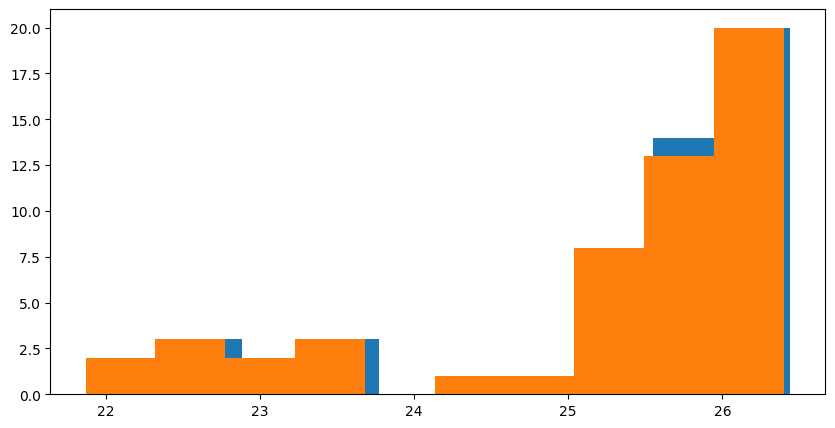

In [282]:
plt.hist(mag_ins_B1_C)
plt.hist(mag_ins_B2_C)

(array([ 2.,  4.,  0.,  3.,  2.,  3.,  7., 12., 24., 11.]),
 array([21.23513611, 21.80208491, 22.36903372, 22.93598253, 23.50293133, 24.06988014, 24.63682895, 25.20377776,
        25.77072656, 26.33767537, 26.90462418]),
 <BarContainer object of 10 artists>)

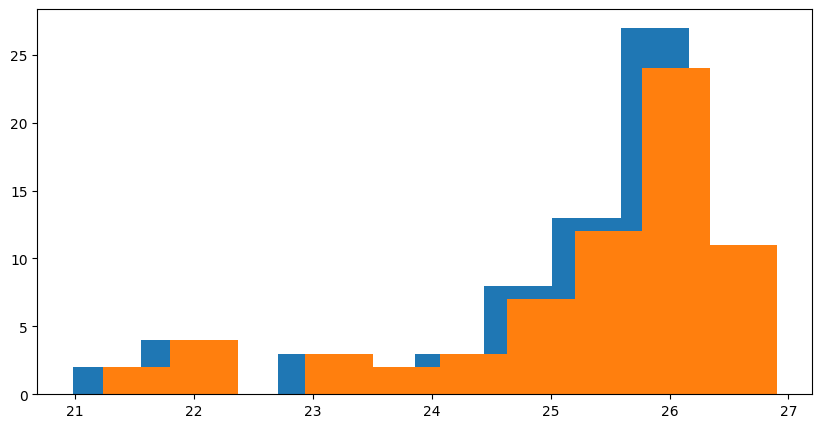

In [283]:
plt.hist(mag_ins_V1_C)
plt.hist(mag_ins_V2_C)

In [284]:
back= np.sqrt(25)*np.std(bias-bias_model)
back_img=np.ones_like(bias)*back

In [285]:
from photutils.utils import  calc_total_error
img_err=calc_total_error(imgV1,back_img,10.5)
star_err_V1=[np.linalg.norm(s.to_mask().get_values(img_err.T)/star_aperturesV1.area) for s in star_aperturesV1]
sky_err_V1=[np.linalg.norm(s.to_mask().get_values(img_err.T)/sky_aperturesV1.area) for s in sky_aperturesV1]
star_err_V1=np.array(star_err_V1)
sky_err_V1=np.array(sky_err_V1)

img_err=calc_total_error(imgV2,back_img,10.5)
star_err_V2=[np.linalg.norm(s.to_mask().get_values(img_err.T)/star_aperturesV2.area) for s in star_aperturesV2]
sky_err_V2=[np.linalg.norm(s.to_mask().get_values(img_err.T)/sky_aperturesV2.area) for s in sky_aperturesV2]
star_err_V2=np.array(star_err_V2)
sky_err_V2=np.array(sky_err_V2)

img_err=calc_total_error(imgB1,back_img,10.5)
star_err_B1=[np.linalg.norm(s.to_mask().get_values(img_err.T)/star_aperturesB1.area) for s in star_aperturesB1]
sky_err_B1=[np.linalg.norm(s.to_mask().get_values(img_err.T)/sky_aperturesB1.area) for s in sky_aperturesB1]
star_err_B1=np.array(star_err_B1)
sky_err_B1=np.array(sky_err_B1)

img_err=calc_total_error(imgB2,back_img,10.5)
star_err_B2=[np.linalg.norm(s.to_mask().get_values(img_err.T)/star_aperturesB2.area) for s in star_aperturesB2]
sky_err_B2=[np.linalg.norm(s.to_mask().get_values(img_err.T)/sky_aperturesB2.area) for s in sky_aperturesB2]
star_err_B2=np.array(star_err_B2)
sky_err_B2=np.array(sky_err_B2)


mag_err_B1=5/2*(1/np.log(10))*np.sqrt(star_err_B1**2+sky_err_B1**2)/np.abs(star_err_B1-sky_err_B1)
mag_err_B2=5/2*(1/np.log(10))*np.sqrt(star_err_B2**2+sky_err_B2**2)/np.abs(star_err_B2-sky_err_B2)
mag_err_V1=5/2*(1/np.log(10))*np.sqrt(star_err_V1**2+sky_err_V1**2)/np.abs(star_err_V1-sky_err_V1)
mag_err_V2=5/2*(1/np.log(10))*np.sqrt(star_err_V2**2+sky_err_V2**2)/np.abs(star_err_V2-sky_err_V2)
mag_err_V1

array([1.48106265, 1.54074657, 1.6294934 , 1.63310151, 1.77786937, 1.79840909, 2.10833719, 2.21351951, 2.32547741,
       2.3631669 , 2.55182751, 2.62707471, 2.69761939, 2.82014561, 2.90241486, 2.90852692, 2.9994244 , 2.99540505,
       3.00588315, 3.0635331 , 3.05908823, 3.08892359, 3.12149938, 3.04900418, 3.15615426, 3.1099177 , 3.1480693 ,
       3.15795499, 3.15451116, 3.1437822 , 3.16512802, 3.19376334, 3.21276465, 3.19393756, 3.21888901, 3.21233706,
       3.21279109, 3.22811525, 3.2421624 , 3.27000627, 3.25919421, 3.24849259, 3.29548465, 3.22781435, 3.27084074,
       3.24104593, 3.22488095, 3.25496064, 3.25304822, 3.2325961 , 3.27403695, 3.25182908, 3.2624703 , 3.25486499,
       3.27446959, 3.26409773, 3.27505666, 3.28454228, 3.31672734, 3.31655851, 3.3298847 , 3.32921965, 3.33246664,
       3.36269647, 3.30901339, 3.30607525, 3.35455058, 3.37432618, 3.38101879, 3.34683297, 3.28284086, 3.40816371])

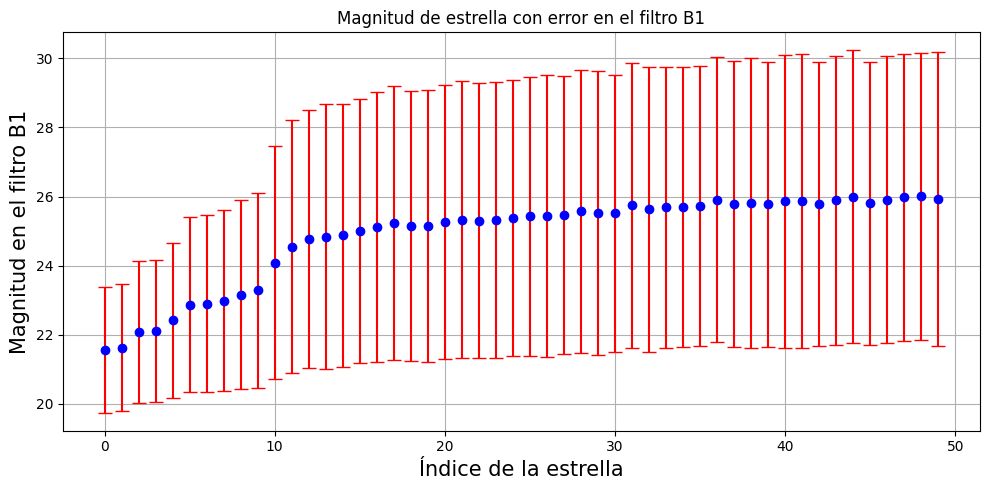

In [286]:
plt.errorbar(np.arange(len(mag_ins_B1)), mag_ins_B1, yerr=mag_err_B1, fmt='o', color='blue', ecolor='red', capsize=5)
plt.xlabel('Índice de la estrella')
plt.ylabel('Magnitud en el filtro B1')
plt.title('Magnitud de estrella con error en el filtro B1')
plt.grid(True)
plt.tight_layout()

# Mostrar la gráfica
plt.show()

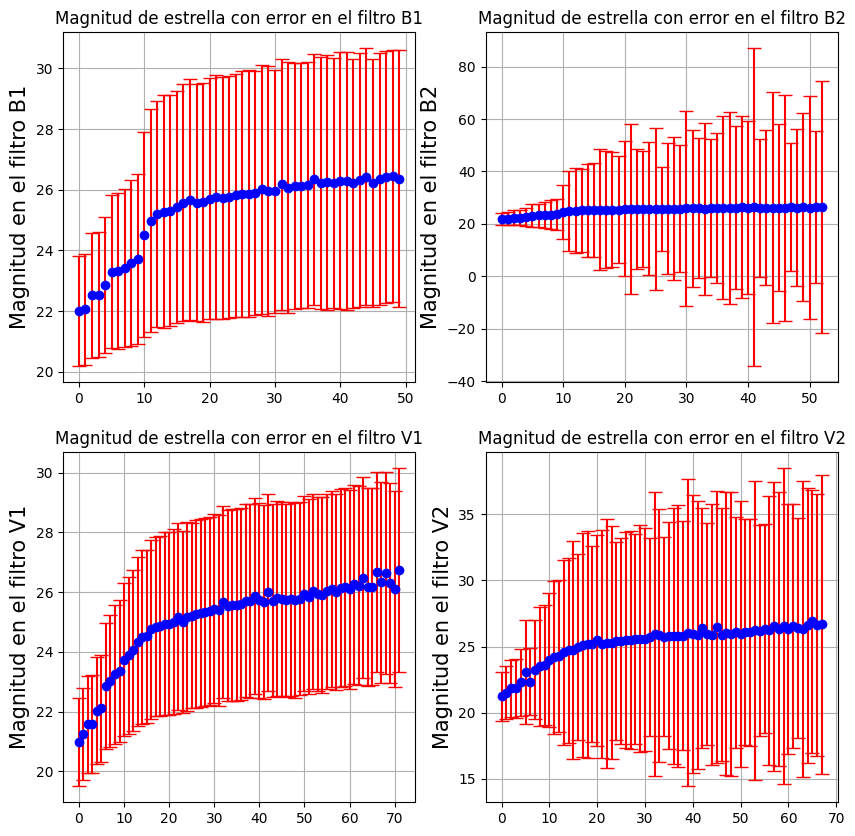

In [299]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

# Gráfica mejorada en el primer subplot
axs[0, 0].errorbar(np.arange(len(mag_ins_B1)), mag_ins_B1_C, yerr=mag_err_B1, fmt='o', color='blue', ecolor='red', capsize=5)
axs[0, 0].set_ylabel('Magnitud en el filtro B1')
axs[0, 0].set_title('Magnitud de estrella con error en el filtro B1')
axs[0, 0].grid(True)

axs[0, 1].errorbar(np.arange(len(mag_ins_B2)), mag_ins_B2_C, yerr=mag_err_B2, fmt='o', color='blue', ecolor='red', capsize=5)
axs[0, 1].set_ylabel('Magnitud en el filtro B2')
axs[0, 1].set_title('Magnitud de estrella con error en el filtro B2')
axs[0, 1].grid(True)

axs[1, 0].errorbar(np.arange(len(mag_ins_V1)), mag_ins_V1_C, yerr=mag_err_V1, fmt='o', color='blue', ecolor='red', capsize=5)

axs[1, 0].set_ylabel('Magnitud en el filtro V1')
axs[1, 0].set_title('Magnitud de estrella con error en el filtro V1')
axs[1, 0].grid(True)

axs[1, 1].errorbar(np.arange(len(mag_ins_V2)), mag_ins_V2_C,yerr=mag_err_V2, fmt='o', color='blue', ecolor='red', capsize=5)
axs[1, 1].set_ylabel('Magnitud en el filtro V2')
axs[1, 1].set_title('Magnitud de estrella con error en el filtro V2')
axs[1, 1].grid(True)

In [289]:
np.shape(mag_ins_V2_C)

(68,)

In [294]:
np.shape(mag_err_B2)

(53,)